## Body Performance (DC)

### Dependencies


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, roc_curve
from catboost import CatBoostClassifier, Pool
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

### Read the CSV File and analyse the dataset

In [2]:
# read the dataset
bp_data0 = pd.read_csv("../data/bodyPerformance.csv")
bp_data0

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,M,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B
...,...,...,...,...,...,...,...,...,...,...,...,...
13388,25.0,M,172.1,71.80,16.2,74.0,141.0,35.8,17.4,47.0,198.0,C
13389,21.0,M,179.7,63.90,12.1,74.0,128.0,33.0,1.1,48.0,167.0,D
13390,39.0,M,177.2,80.50,20.1,78.0,132.0,63.5,16.4,45.0,229.0,A
13391,64.0,F,146.1,57.70,40.4,68.0,121.0,19.3,9.2,0.0,75.0,D


In [3]:
# dataframe information
bp_data0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13393 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13393 non-null  float64
 1   gender                   13393 non-null  object 
 2   height_cm                13393 non-null  float64
 3   weight_kg                13393 non-null  float64
 4   body fat_%               13393 non-null  float64
 5   diastolic                13393 non-null  float64
 6   systolic                 13393 non-null  float64
 7   gripForce                13393 non-null  float64
 8   sit and bend forward_cm  13393 non-null  float64
 9   sit-ups counts           13393 non-null  float64
 10  broad jump_cm            13393 non-null  float64
 11  class                    13393 non-null  object 
dtypes: float64(10), object(2)
memory usage: 1.2+ MB


In [4]:
# check the unique values of the class
np.sort(bp_data0['class'].unique())

array(['A', 'B', 'C', 'D'], dtype=object)

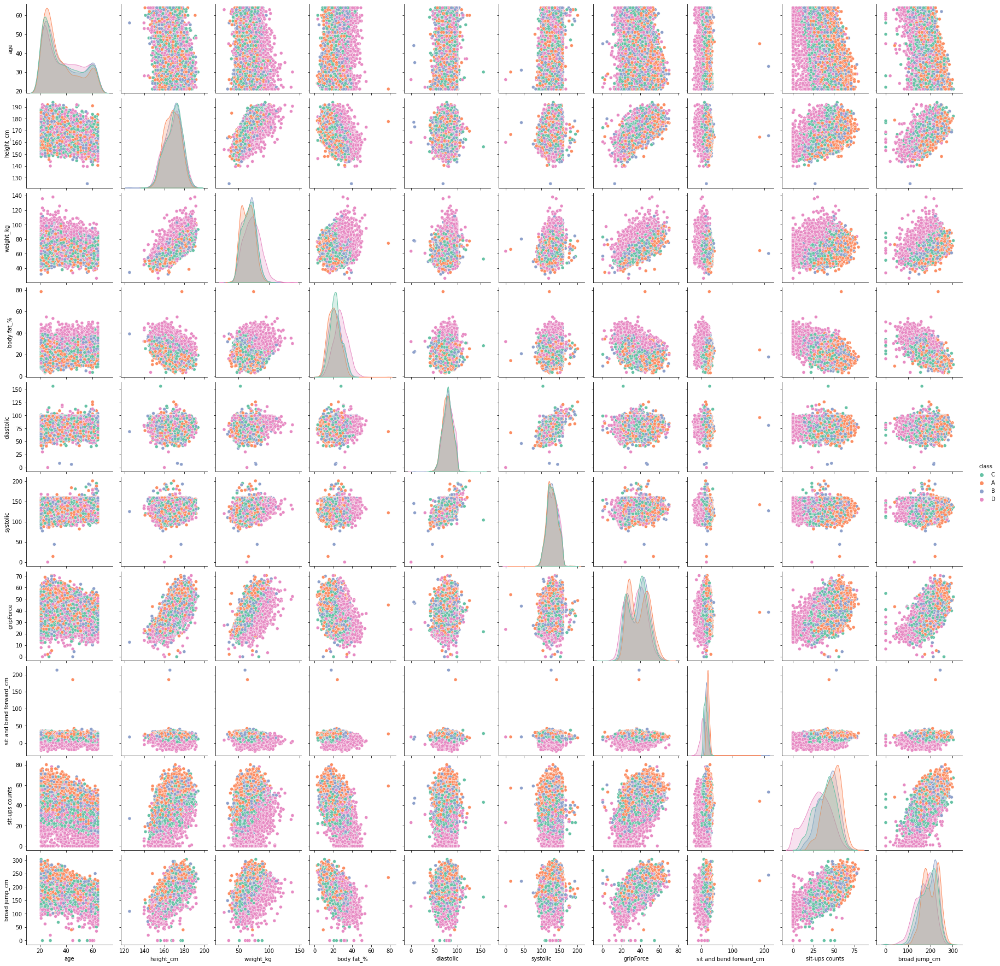

In [5]:
# plot all data in pairs to see correlations
fig1 = sns.pairplot(bp_data0, hue="class", palette="Set2");
plt.savefig('../images/Body_Performance_Correlations_DC_Fig1.png')


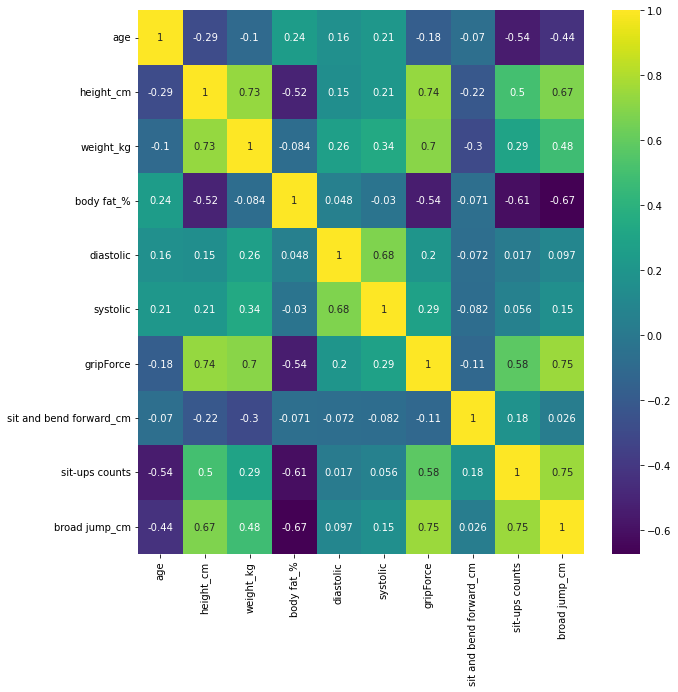

In [6]:
# analyse data correlation
fig, ax = plt.subplots(figsize=(10,10))
corr = sns.heatmap(bp_data0.corr(), ax=ax, cmap='viridis', annot=True)
plt.savefig('../images/Body_Performance_Correlations_DC_Fig2.png', dpi='figure',bbox_inches='tight') 

<Figure size 576x576 with 0 Axes>

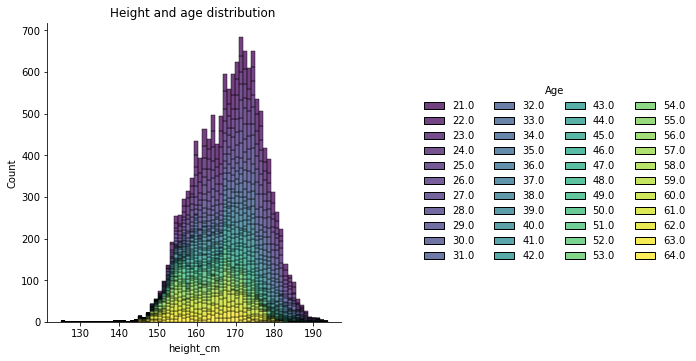

In [7]:
# plot height distribution and highlight the age of the people included in the research

plt.figure(figsize=[8, 8])
g = sns.displot(data=bp_data0, x="height_cm", hue="age", multiple="stack", palette="viridis")

g.fig.subplots_adjust(top=.95)

plt.title("Height and age distribution ")
sns.move_legend(g, "upper left", bbox_to_anchor=(1,0.8), ncol=4, title="Age", frameon=False)


plt.savefig('../images/Body_Performance_Height_Age_Distribution_DC_Fig3.png', dpi='figure',bbox_inches='tight') 

fig.show()

<Figure size 576x576 with 0 Axes>

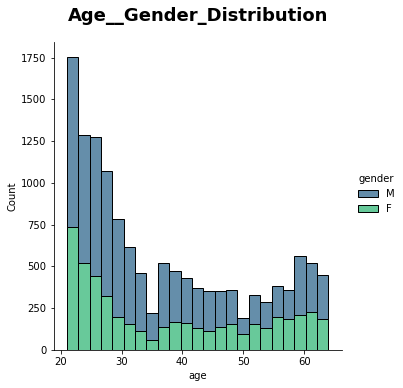

In [8]:
# Age distribution in total count of people; highlith gender distribution

plt.figure(figsize=[8, 8])

sns.displot(data=bp_data0, x="age", hue="gender", multiple="stack", palette="viridis")
plt.title('Age__Gender_Distribution', y=1.05, fontsize=18, fontweight="bold")
plt.savefig('../images/Body_Performance_Age__Gender_Distribution_DC_Fig4.png', dpi='figure',bbox_inches='tight')

<Figure size 576x576 with 0 Axes>

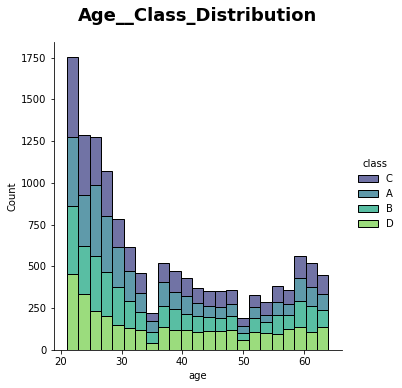

In [9]:
# age against total count and highlight the body performance class 
plt.figure(figsize=[8, 8])

sns.displot(data=bp_data0, x="age", hue="class", multiple="stack", palette="viridis")
plt.title('Age__Class_Distribution', y=1.05, fontsize=18, fontweight="bold")
plt.savefig('../images/Body_Performance_Age__Class_Distribution_DC_Fig5.png', dpi='figure',bbox_inches='tight')

In [10]:
fig = px.scatter(bp_data0, x="body fat_%", y="age", color="gender", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")

plt.savefig('../images/Body_Performance_Age__Body_Fat_Distribution_DC_Fig5a.png', dpi='figure',bbox_inches='tight')
fig.show()

<Figure size 432x288 with 0 Axes>

In [11]:
fig = px.scatter(bp_data0, x="body fat_%", y="age", color="class", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")

plt.savefig('../images/Body_Performance_Age__bodyfat_class_DC_Fig5b.png', dpi='figure',bbox_inches='tight')
fig.show()

<Figure size 432x288 with 0 Axes>

In [12]:
fig = px.scatter(bp_data0, x="sit-ups counts", y="age", color="class", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")

plt.savefig('../images/Body_Performance_Age__situps_DC_Fig5c.png', dpi='figure',bbox_inches='tight')
fig.show()

<Figure size 432x288 with 0 Axes>

In [13]:
# plot the age and weight and highlight the class of body performance
plt.figure(figsize=[10, 10])
px.scatter(bp_data0, x='weight_kg', y='age', size="body fat_%", color='class',
                title="Classes by Age and Weight")

# plt.savefig('../images/Body_Performance_Age__Weight_Class_Distribution_DC_Fig6.png', dpi='figure',bbox_inches='tight')




<Figure size 720x720 with 0 Axes>

In [14]:
# plot the blod pressure (systolic, diastolic) and highight the class of body performance
px.scatter(bp_data0, x='diastolic', y='systolic', size="age", color='class',
                title="Blood_Pressure_by_Class")
# plt.savefig('../images/Body_Performance_Blood_Pressure_by_Class_DC_Fig6a.png', dpi='figure',bbox_inches='tight')

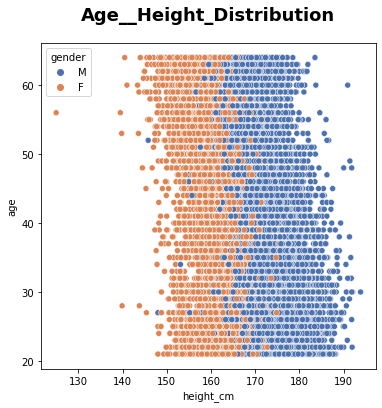

In [15]:
# visualize age, height distribution by gender
plt.figure(figsize=[6, 6])
sns.scatterplot(data=bp_data0, x="height_cm", y="age", hue="gender", palette="deep")
plt.title('Age__Height_Distribution', y=1.05, fontsize=18, fontweight="bold")
plt.savefig('../images/Body_Performance_Age__Height_Distribution_DC_Fig7.png', dpi='figure',bbox_inches='tight')

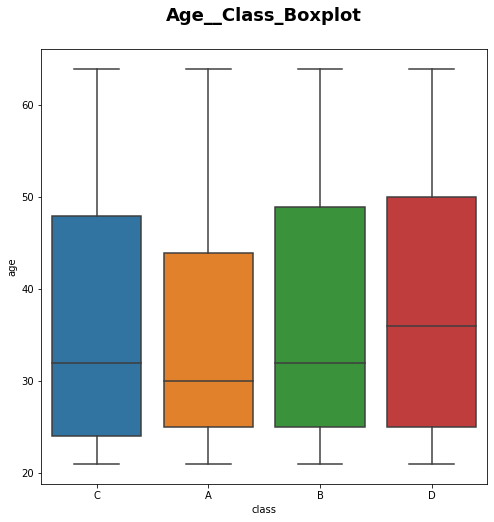

In [16]:
plt.figure(figsize=[8, 8])
ax = sns.boxplot(x="class", y="age", data=bp_data0)
plt.title('Age__Class_Boxplot', y=1.05, fontsize=18, fontweight="bold")
plt.savefig('../images/Body_Performance_Age__Class_Boxplot_DC_Fig8.png', dpi='figure',bbox_inches='tight')

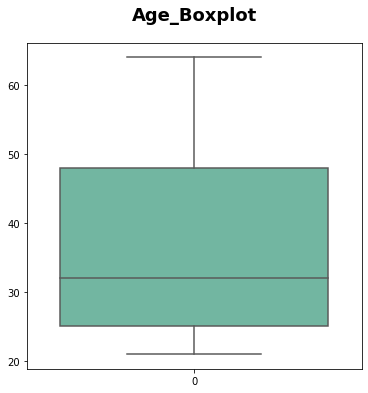

In [17]:
plt.figure(figsize=[6, 6])
ax = sns.boxplot(data=bp_data0.age, palette="Set2")
plt.title('Age_Boxplot', y=1.05, fontsize=18, fontweight="bold")
plt.savefig('../images/Body_Performance_Age_Boxplot_DC_Fig9.png', dpi='figure',bbox_inches='tight')

#### There is a higher number of people in the 21-25 years of age range.
#### There is a negative correlation between age and situp counts, as well as between body fat and broad jump;
#### The dataset is clean with no nan values


In [18]:
# label the string values 
bp_data0.loc[bp_data0['gender'] == 'M', 'gender',] = 0
bp_data0.loc[bp_data0['gender'] == 'F', 'gender',] = 1
bp_data0.loc[bp_data0['class'] == 'A', 'class',] = 1
bp_data0.loc[bp_data0['class'] == 'B', 'class',] = 2
bp_data0.loc[bp_data0['class'] == 'C', 'class',] = 3
bp_data0.loc[bp_data0['class'] == 'D', 'class',] = 4
bp_data0

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,0,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,3
1,25.0,0,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,1
2,31.0,0,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,3
3,32.0,0,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,2
4,28.0,0,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
13388,25.0,0,172.1,71.80,16.2,74.0,141.0,35.8,17.4,47.0,198.0,3
13389,21.0,0,179.7,63.90,12.1,74.0,128.0,33.0,1.1,48.0,167.0,4
13390,39.0,0,177.2,80.50,20.1,78.0,132.0,63.5,16.4,45.0,229.0,1
13391,64.0,1,146.1,57.70,40.4,68.0,121.0,19.3,9.2,0.0,75.0,4


In [19]:
# select columns to be used
bp_data = bp_data0[["age","gender","height_cm","weight_kg","body fat_%","diastolic","systolic","class", 
                    "gripForce", "sit and bend forward_cm","sit-ups counts","broad jump_cm" ]]

### Machine Learning 

In [20]:
# separate the dataset in train and test; allocate 70% to train and 30% to test, and select random state 42

x = bp_data.drop('class', axis=1)
y = bp_data['class']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [21]:
## use LabelEncoder for encoding any object field 

bp_df_copy = bp_data.copy()

for i in bp_df_copy:
    if bp_df_copy[i].dtypes == 'object':
        bp_df_copy[i] = LabelEncoder().fit_transform(bp_df_copy[i])
        
bp_df_copy


,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,class,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
0,27.0,0,172.3,75.24,21.3,80.0,130.0,2,54.9,18.4,60.0,217.0
1,25.0,0,165.0,55.80,15.7,77.0,126.0,0,36.4,16.3,53.0,229.0
2,31.0,0,179.6,78.00,20.1,92.0,152.0,2,44.8,12.0,49.0,181.0
3,32.0,0,174.5,71.10,18.4,76.0,147.0,1,41.4,15.2,53.0,219.0
4,28.0,0,173.8,67.70,17.1,70.0,127.0,1,43.5,27.1,45.0,217.0
...,...,...,...,...,...,...,...,...,...,...,...,...
13388,25.0,0,172.1,71.80,16.2,74.0,141.0,2,35.8,17.4,47.0,198.0
13389,21.0,0,179.7,63.90,12.1,74.0,128.0,3,33.0,1.1,48.0,167.0
13390,39.0,0,177.2,80.50,20.1,78.0,132.0,0,63.5,16.4,45.0,229.0
13391,64.0,1,146.1,57.70,40.4,68.0,121.0,3,19.3,9.2,0.0,75.0


In [22]:
# use a copy of the dataset and separate it in train and test with the same allocation 70% train and 30% test, 
# and select random state 42
X = bp_df_copy.drop('class', axis=1)
Y = bp_df_copy['class']

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

#### XGB model 

In [23]:
# create a model by using XGB library (eXtreme Gradient Boosting) and print the report on accuracy of the model
xgb = XGBClassifier(random_state=101, verbosity=1)
xgb.fit(X_train, Y_train)
pred = xgb.predict(X_test)
print(classification_report(Y_test, pred))

              precision    recall  f1-score   support

           0       0.77      0.86      0.81      1040
           1       0.63      0.62      0.62       966
           2       0.72      0.70      0.71       969
           3       0.91      0.84      0.87      1043

    accuracy                           0.76      4018
   macro avg       0.76      0.75      0.75      4018
weighted avg       0.76      0.76      0.76      4018



In [24]:
print(xgb)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=101, reg_alpha=0, ...)


In [25]:
xgb.best_ntree_limit

100

In [26]:
# make predictions for test data
predictions = xgb.predict(X_test)

In [27]:
# evaluate predictions
accuracy = accuracy_score(Y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 75.81%


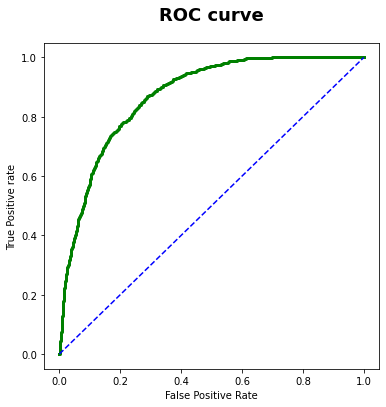

In [28]:
# ROC curve (receiver operating characteristic curve)
prob = xgb.predict_proba(X_test)
fpr, tpr, thresh = roc_curve(Y_test, prob[:,1], pos_label=1)

random_probs = [0 for i in range(len(Y_test))]
p_fpr, p_tpr, _ = roc_curve(Y_test, random_probs, pos_label=1)

plt.figure(figsize=[6, 6])
plt.plot(fpr, tpr, linestyle='-',color='green', label='XGBoost', linewidth=3)
plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
plt.title('ROC curve', y=1.05, fontsize=18, fontweight="bold")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')


plt.savefig('../images/Body_Performance_XGB_ROC_Curve_DC_Fig10.png', dpi='figure',bbox_inches='tight')

In [29]:
# Light GBM (Light Gradient Boosting)
lgb = LGBMClassifier(random_state=101)
lgb.fit(X_train, Y_train)
pred = lgb.predict(X_test)
print(classification_report(Y_test, pred))

              precision    recall  f1-score   support

           0       0.77      0.88      0.82      1040
           1       0.64      0.66      0.65       966
           2       0.75      0.70      0.72       969
           3       0.93      0.84      0.88      1043

    accuracy                           0.77      4018
   macro avg       0.77      0.77      0.77      4018
weighted avg       0.77      0.77      0.77      4018



In [30]:
print(lgb)

LGBMClassifier(random_state=101)


In [31]:
# make predictions for test data
predictions = lgb.predict(X_test)

In [32]:
# evaluate predictions
accuracy = accuracy_score(Y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 77.08%


Text(0, 0.5, 'True Positive rate')

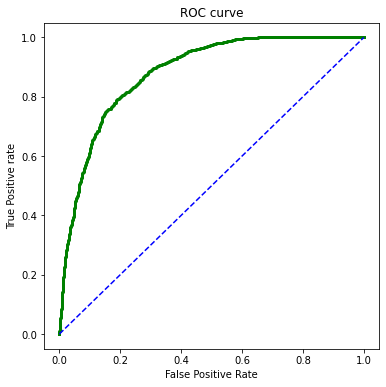

In [33]:
prob = lgb.predict_proba(X_test)
fpr, tpr, thresh = roc_curve(Y_test, prob[:,1], pos_label=1)

random_probs = [0 for i in range(len(Y_test))]
p_fpr, p_tpr, _ = roc_curve(Y_test, random_probs, pos_label=1)

plt.figure(figsize=[6, 6])
plt.plot(fpr, tpr, linestyle='-',color='green', label='LightBoost', linewidth=3)
plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')

In [34]:
# correlation
bp_df_copy.corr()["class"]

age                        0.065612
gender                    -0.075605
height_cm                  0.037753
weight_kg                  0.214129
body fat_%                 0.341956
diastolic                  0.066761
systolic                   0.035484
class                      1.000000
gripForce                 -0.136088
sit and bend forward_cm   -0.588123
sit-ups counts            -0.452832
broad jump_cm             -0.262154
Name: class, dtype: float64

In [35]:
# save lgb model
file = open('../models/body_performance_prediction_lgb', 'wb') 

import pickle
pickle.dump(lgb, file)
file.close()

In [36]:
# load the trained model

with open('../models/body_performance_prediction_lgb' , 'rb') as f:
    loaded_model = pickle.load(f)
    


In [37]:
# test user input 
user_input = {"age": 40, "gender": 0, "height_cm": 160, "weight_kg":170, 
              "body fat_%": 41.3, "diastolic": 10, "systolic":10, "gripForce":15,
              "sit and bend forward_cm" : 2, "sit-ups counts": 10, "broad jump_cm": 20}
user_input = pd.DataFrame(user_input, index=[0])
user_input

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
0,40,0,160,170,41.3,10,10,15,2,10,20


In [38]:
# Convert user_input data into np array
user_input = user_input.values.reshape(1, -1)
user_input

array([[ 40. ,   0. , 160. , 170. ,  41.3,  10. ,  10. ,  15. ,   2. ,
         10. ,  20. ]])

In [39]:
# Load the model and predict the outcome based on user_input
lgb_model_predict = loaded_model.predict(user_input) 
lgb_model_predict 

array([3])

In [40]:
print(f"You body performance belongs to class: ", *np.array(lgb_model_predict))

You body performance belongs to class:  3


### Body Performance clasification

class:   
1 = A best  
2 = B  
3 = C  
4 = D worst   

### User Input Details

age  
gender: 0 Male, 1 Female  

height_cm 

weight_kg 

body fat_% 

diastolic  = the first and higher number result when using a blood pressure monitor and represents the pressure inside the arteries when the heart beats.
systolic  = the second and lower number measure that represents the pressure inside the artery when the heart rests between beats.

gripForce  - use a dynamometer to measure it (avergage values 26 for female 20-40 years old, 24 for women older than 40; 
male average is around 46 for up tp 40 years old and 41 for older men

sit and bend forward_cm  - instructions for measurement can be found on https://www.verywellfit.com/sit-and-reach-flexibility-test-3120279

sit-ups counts  - number of situps per minute 

broad jump_cm  - how far you can jump from a standing position


#### BMI Calculator

In [41]:
## BMI calculator
weight =  58
height = 150
BMI = weight / (height/100)**2  
BMI

25.77777777777778

#### Simple Body Fat Calculator (there are various ways to calculate it and the results are slightly different)

In [42]:
## body fat percentage female
BMI = 25.7
age = 64

bfp_f = (1.20  * BMI) + (0.23 * age) - 5.4
bfp_f

40.16

In [43]:
## body fat percentage male
BMI = 25.7
age = 27

bfp_m = (1.20  * BMI) + (0.23 * age) - 16.2
bfp_m

20.849999999999998

##### Dataset reference: https://www.kaggle.com/datasets/kukuroo3/body-performance-data